# Read in data

In [17]:
import pandas as pd
from pathlib import Path

# -------------------------------------------------------------------------
# 1. locate the workbook
xls_path = Path(r'D:\VScode\OSL_source_ana\data\OSL_ratio.xlsx')

# 2. pull all sheets into a dict   {sheet_name: DataFrame}
sheets = pd.read_excel(xls_path, sheet_name=None, engine='openpyxl')

# 3. make one DataFrame variable per sheet
#    -> df_527, df_514, …
globals().update({f"df_{name}": df for name, df in sheets.items()})

# -------------------------------------------------------------------------
#  ▸ from here on you can use the individual DataFrames directly
# -------------------------------------------------------------------------
# print(df_527.head())   #   sheet “527”
# print(df_514.shape)    #   sheet “514”

df_527.info

# generate a list of random int number betwee 1 to 147
import random
# define seed

random.seed(1)

random_list = random.sample(range(1, 147), 50)
# sort the list in ascending order
random_list.sort()
print(random_list) 

# for df_517 (not 527), get the columns using the indexes in the random list
# df_517 = pd.read_excel(xls_path, sheet_name='517', engine='openpyxl')
df_517 = df_517.iloc[:, random_list]




[1, 2, 3, 4, 8, 17, 25, 27, 28, 29, 30, 31, 35, 38, 41, 45, 49, 54, 55, 57, 59, 64, 66, 68, 69, 70, 71, 84, 87, 88, 93, 98, 100, 106, 110, 111, 113, 115, 116, 121, 123, 124, 125, 127, 129, 133, 136, 138, 139, 141]


In [9]:
df_517.columns.shape

(147,)

# Analyze data distribution

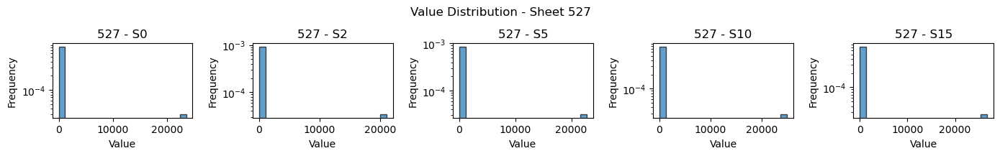

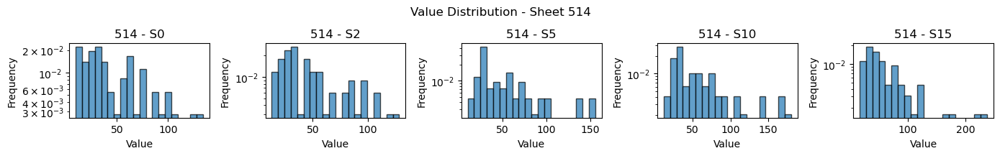

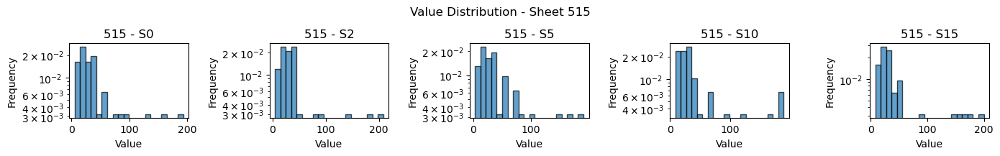

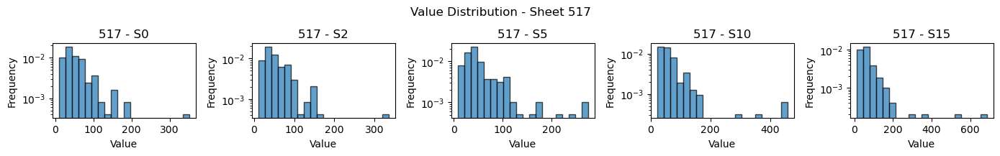

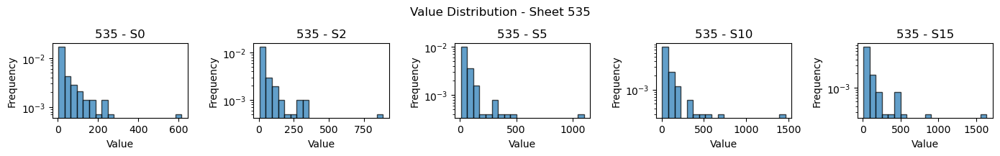

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# Reload your data (if needed)
xls_path = Path(r'D:\VScode\OSL_source_ana\data\OSL_ratio.xlsx')
sheets = pd.read_excel(xls_path, sheet_name=None, engine='openpyxl')

# Plot histograms for each row in all sheets
for sheet_name, df in sheets.items():
    plt.figure(figsize=(14, 8))
    
    # Extract row names and numeric data (exclude first column "Unnamed: 0")
    row_names = df.iloc[:, 0].tolist()  # ["S0", "S2", ...]
    data = df.iloc[:, 1:].values  # Numeric values only
    
    # Create subplots for each row
    n_rows = len(row_names)
    n_cols = 5  # Adjust based on your preference
    for idx, (row_name, row_data) in enumerate(zip(row_names, data)):
        plt.subplot(n_rows, n_cols, idx + 1)
        plt.hist(row_data, bins=20, alpha=0.7, edgecolor='k',density=True)
        plt.title(f"{sheet_name} - {row_name}")
        plt.xlabel("Value")
        plt.ylabel("Frequency")
        plt.yscale('log')  # Use log scale if values vary widely
    
    plt.tight_layout()
    plt.suptitle(f"Value Distribution - Sheet {sheet_name}", y=1.02)
    plt.show()

# 画图，颜色代表比值，大小代表原始值，大小分为n级

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def process_and_plot(df, n_grades: int = 5,
                     yticks_labels=('S2/S0', 'S5/S0', 'S10/S0', 'S15/S0'),
                     cmap='viridis', dpi=100,
                     size_grades=None, color_grades=None,row_height=0.8,title=''):

    # ---------- 1. ratio & sorting ----------
    numeric_cols = df.columns[1:]
    ratio_df = df.iloc[1:].copy()
    ratio_df[numeric_cols] = df.iloc[1:][numeric_cols] / df.iloc[0][numeric_cols].values

    means = ratio_df[numeric_cols].mean()
    sorted_columns = [df.columns[0]] + means.sort_values(ascending=False).index.tolist()
    ratio_df_sorted = ratio_df[sorted_columns]
    original_df_sorted = df[sorted_columns]

    # ---------- 2. mesh for scatter ----------
    n_rows, n_cols = ratio_df_sorted.shape[0], len(sorted_columns) - 1
    x, y = np.meshgrid(np.arange(n_cols), np.arange(n_rows))
    x, y = x.flatten(), y.flatten()

    colors = ratio_df_sorted.iloc[:, 1:].values.flatten()
    raw_sizes = original_df_sorted.iloc[1:, 1:].values.flatten()

    # ---------- 3. size grade handling ----------
    if size_grades is None:
        size_edges = [0, 50, 100, 200, 500, np.inf]
        digitize_size_edges = size_edges[1:-1]
    elif not size_grades:       # []  ➜ quantiles
        quant_edges = np.quantile(raw_sizes, np.linspace(0, 1, n_grades + 1))
        digitize_size_edges = quant_edges[1:-1]
        size_edges = quant_edges
    else:                       # user‑supplied
        size_edges = size_grades
        digitize_size_edges = size_edges[1:-1] if len(size_edges) > 2 else []

    n_size_bins = len(digitize_size_edges) + 1
    grade_sizes = np.linspace(150, 900, n_size_bins)
    grade_idx = np.digitize(raw_sizes, digitize_size_edges, right=True)
    sizes_for_plot = grade_sizes[grade_idx]

    # ---------- 4. color grade handling ----------
    if color_grades is None:
        color_edges = [-np.inf, 0.5, 1, 1.5, 3, 5, np.inf]
        digitize_color_edges = color_edges[1:-1]
        n_color_bins = len(color_edges) - 1
        cmap_discrete = plt.get_cmap('tab20c', n_color_bins)
        color_indices = np.digitize(colors, digitize_color_edges, right=True)
        # Generate bin labels
        bin_labels = []
        for i in range(n_color_bins):
            if i == 0:
                bin_labels.append(f'<{color_edges[1]}')
            elif i == n_color_bins - 1:
                bin_labels.append(f'≥{color_edges[-2]}')
            else:
                bin_labels.append(f'{color_edges[i]} – {color_edges[i+1]}')
    elif not color_grades:       # [] ➜ raw continuous colours
        cmap_discrete = cmap
        color_indices = colors
        bin_labels = None
    else:
        color_edges = color_grades
        digitize_color_edges = color_edges[1:-1] if len(color_edges) > 2 else []
        n_color_bins = len(color_edges) - 1

        cmap_discrete = plt.get_cmap(cmap, n_color_bins)
        color_indices = np.digitize(colors, digitize_color_edges, right=True)
        bin_labels = []
        for i in range(n_color_bins):
            if i == 0:
                bin_labels.append(f'<{color_edges[1]}')
            elif i == n_color_bins - 1:
                bin_labels.append(f'≥{color_edges[-2]}')
            else:
                bin_labels.append(f'{color_edges[i]} – {color_edges[i+1]}')

    # ---------- 5. adaptive figure width ----------
    fig_w = max(6, 0.6 * n_cols)
    fig_h = max(3, row_height * n_rows)   # <‑‑ changed
    fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=dpi)

    # colour_list = []
    # for i in range(n_color_bins):
    #     if i == 0:
    #         colour_list.append('blue')     # < 1
    #     elif i == 1:
    #         colour_list.append('orange')   # 1 – 1.5
    #     else:
    #         colour_list.append('red')      # > 1.5

    # 这里改颜色表
    colour_list = ['lightblue','dodgerblue','gold','lightcoral','red','darkred']

    cmap_discrete = ListedColormap(colour_list)

    # ---------- 6. scatter plot ----------
    scatter = ax.scatter(
        x, y,
        c=color_indices if bin_labels is not None else colors,
        s=sizes_for_plot,
        cmap=cmap_discrete,
        alpha=0.6,
        edgecolors='w',
        linewidth=0.5,
        norm=plt.Normalize(vmin=0, vmax=n_color_bins - 1) if bin_labels else None
    )

    # ---------- 7. colorbar ----------
    if bin_labels:
        cbar = plt.colorbar(scatter, ax=ax, label='Ratio (Sx / S0)', shrink=0.8)
        cbar.set_ticks(np.arange(n_color_bins) )
        cbar.set_ticklabels(bin_labels)
    else:
        plt.colorbar(scatter, ax=ax, label='Ratio (Sx / S0)', shrink=0.8)

    # ---------- 8. axis ticks ----------
    ax.set_xticks(np.arange(n_cols), labels=sorted_columns[1:], rotation=45, ha='right')
    ax.set_yticks(np.arange(n_rows),
                  yticks_labels if len(yticks_labels) == n_rows else ratio_df_sorted.iloc[:, 0])
    ax.set_xlabel('Slice number')
    ax.set_ylabel('Ratio')
    # set x-axis limits to the range of the data
    ax.set_xlim(-0.5, n_cols-0.5)
    # set y-axis limits to the range of the data
    ax.set_ylim(-0.8, n_rows-0.2 )
    # reverse y-axis
    ax.invert_yaxis()
    ax.set_title(title)

    # ---------- 9. size legend (fixed) ----------
    lower_display = (np.floor(np.array(size_edges[:-1]) / 10)) * 10
    upper_display = (np.ceil(np.array(size_edges[1:])  / 10)) * 10
    if len(lower_display) < n_size_bins:
        lower_display = np.append(lower_display,
                                  [np.ceil(size_edges[-2] / 10) * 10])

    def _fmt(edge: float) -> str:
        if np.isneginf(edge):
            return '-∞'
        if np.isposinf(edge):
            return '∞'
        return f'{int(edge)}'

    grade_labels = []
    for low, high in zip(lower_display, upper_display):
        if np.isposinf(high):
            grade_labels.append(f'≥{_fmt(low)}')
        elif np.isneginf(low):
            grade_labels.append(f'≤{_fmt(high)}')
        else:
            grade_labels.append(f'{_fmt(low)} – {_fmt(high)}')

    for gs, lbl in zip(grade_sizes, grade_labels):
        ax.scatter([], [], s=gs, color='gray', alpha=0.6,
                   edgecolors='w', linewidth=0.5, label=lbl)

    ax.legend(title='', loc='center left', bbox_to_anchor=(0.7, 1.25),
               ncol=3, frameon=False)
    # bbox_to_anchor=(1, 0.5),


    plt.tight_layout()
    plt.show()
    return fig


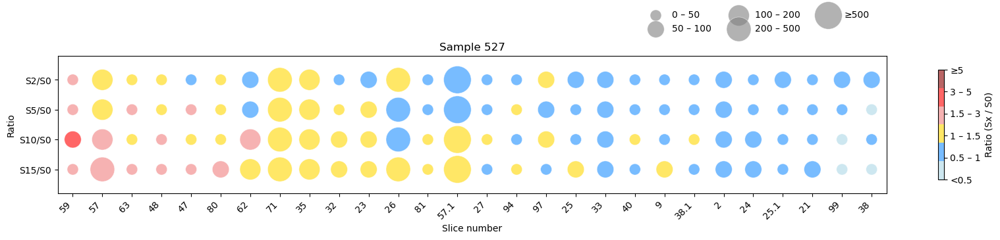

In [26]:
fig=process_and_plot(
    df_527,
    size_grades=[0,50,100,200,500, np.inf],
    color_grades=[-np.inf,0.5,1,1.5,3,5, np.inf],
    cmap='plasma',
    row_height=1,
    title='Sample 527',
)

fig.savefig('Figures/527.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/527.pdf', dpi=600, bbox_inches='tight')

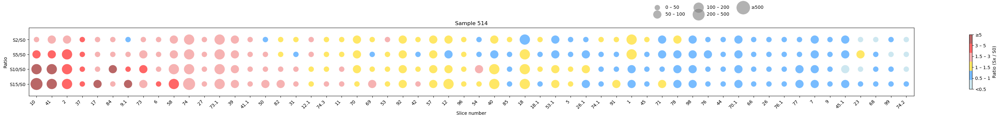

In [27]:
fig=process_and_plot(df_514, size_grades=[0,50,100,200,500, np.inf],
    color_grades=[-np.inf,0.5,1,1.5,3,5, np.inf],
    cmap='tab20',
    row_height=1,
    title='Sample 514',
    
    )

fig.savefig('Figures/514.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/514.pdf', dpi=600, bbox_inches='tight')

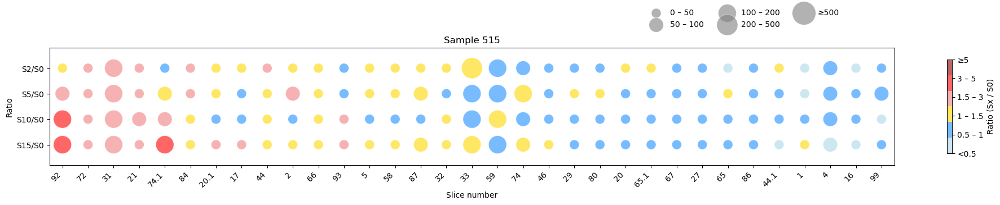

In [28]:
fig=process_and_plot(df_515, size_grades=[0,50,100,200,500, np.inf],
    color_grades=[-np.inf,0.5,1,1.5,3,5, np.inf],
    cmap='tab20',
    row_height=1,
    title='Sample 515',
    )

fig.savefig('Figures/515.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/515.pdf', dpi=600, bbox_inches='tight')

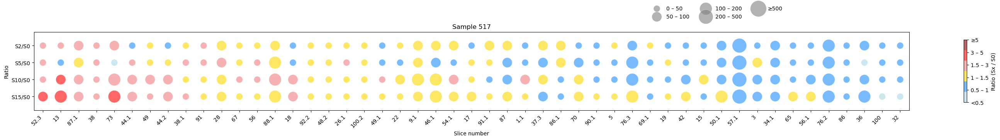

In [29]:
fig=process_and_plot(df_517, size_grades=[0,50,100,200,500, np.inf],
    color_grades=[-np.inf,0.5,1,1.5,3,5, np.inf],
    cmap='tab20',
    row_height=1,
    title='Sample 517',
    )

fig.savefig('Figures/517.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/517.pdf', dpi=600, bbox_inches='tight')

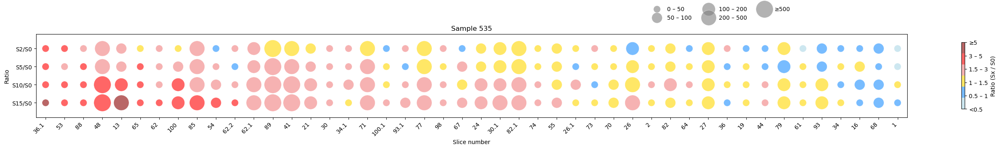

In [30]:
fig=process_and_plot(df_535, size_grades=[0,50,100,200,500, np.inf],
    color_grades=[-np.inf,0.5,1,1.5,3,5, np.inf],
    cmap='tab20',
    row_height=1,
    title='Sample 535',
    )

fig.savefig('Figures/535.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/535.pdf', dpi=600, bbox_inches='tight')

In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math                    # new: for floor / ceil helpers

def process_and_plot(df, n_grades: int = 5,
                     yticks_labels=('S2/S0', 'S5/S0', 'S10/S0', 'S15/S0'), cmap='viridis',dpi=100):
    # ---------- 1. ratio & sorting ----------
    numeric_cols = df.columns[1:]
    ratio_df = df.iloc[1:].copy()
    ratio_df[numeric_cols] = df.iloc[1:][numeric_cols].div(df.iloc[0][numeric_cols].values)

    means = ratio_df[numeric_cols].mean()
    sorted_columns = [df.columns[0]] + means.sort_values(ascending=False).index.tolist()
    ratio_df_sorted = ratio_df[sorted_columns]
    original_df_sorted = df[sorted_columns]

    # ---------- 2. mesh for scatter ----------
    n_rows, n_cols = ratio_df_sorted.shape[0], len(sorted_columns) - 1
    x, y = np.meshgrid(np.arange(n_cols), np.arange(n_rows))
    x, y = x.flatten(), y.flatten()

    colors = ratio_df_sorted.iloc[:, 1:].values.flatten()
    raw_sizes = original_df_sorted.iloc[1:, 1:].values.flatten()

    # ---------- 3. quantile‑based bubble sizes ----------
    quant_edges = np.quantile(raw_sizes, np.linspace(0, 1, n_grades + 1))
    grade_sizes = np.linspace(150, 900, n_grades)
    grade_idx = np.digitize(raw_sizes, quant_edges[1:-1], right=True)
    sizes_for_plot = grade_sizes[grade_idx]

    # ---------- 4. adaptive figure width ----------
    col_width = 0.6
    fig_w = max(6, col_width * n_cols)
    fig_h = 6
    fig = plt.figure(figsize=(fig_w, fig_h), dpi=dpi)

    scatter = plt.scatter(
        x, y,
        c=colors,
        s=sizes_for_plot,
        cmap=cmap,
        alpha=0.6,
        edgecolors='w',
        linewidth=0.5
    )
    plt.colorbar(scatter, label='Ratio (Sx / S0)', shrink=0.8)

    # ---------- 5. axis ticks ----------
    plt.xticks(np.arange(n_cols), labels=sorted_columns[1:], rotation=45, ha='right')
    plt.yticks(np.arange(n_rows),
               yticks_labels if len(yticks_labels) == n_rows else ratio_df_sorted.iloc[:, 0])

    plt.xlabel('Slice number')
    plt.ylabel('Ratio')

    # ---------- 6. size‑grade legend (rounded 10s) ----------
    # create display edges rounded to nearest tens
    lower_display = (np.floor(quant_edges[:-1] / 10) * 10).astype(int)
    upper_display = (np.ceil(quant_edges[1:]   / 10) * 10).astype(int)
    grade_labels = [f'{low:d} – {high:d}' for low, high in zip(lower_display, upper_display)]

    for gs, lbl in zip(grade_sizes, grade_labels):
        plt.scatter([], [], s=gs, color='gray', alpha=0.6,
                    edgecolors='w', linewidth=0.5, label=lbl)

    plt.legend(title='', loc='center left', ncol=2, frameon=True)
    plt.tight_layout()
    plt.show()
    return fig
    



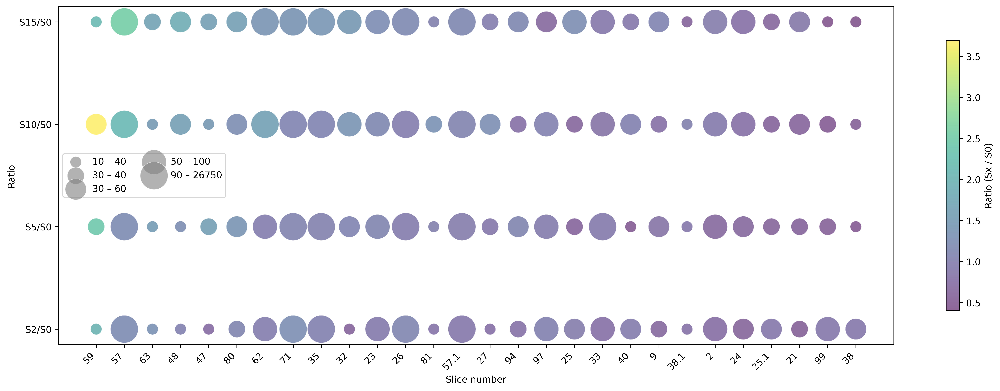

In [ ]:
fig=process_and_plot(df_527, cmap='viridis', dpi=100)

# fig.savefig('Figures/527.png', dpi=600, bbox_inches='tight')
# fig.savefig('Figures/527.pdf', dpi=600, bbox_inches='tight')

In [89]:
fig=process_and_plot(df_514, cmap='viridis', dpi=600)

fig.savefig('Figures/514.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/514.pdf', dpi=600, bbox_inches='tight')

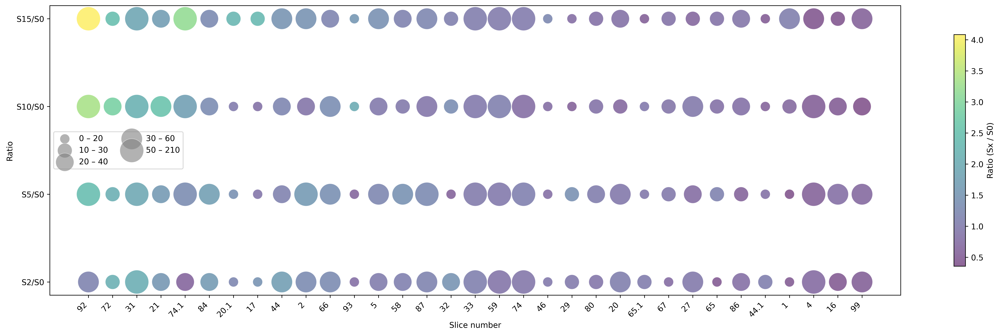

In [90]:
fig=process_and_plot(df_515, cmap='viridis', dpi=600)

fig.savefig('Figures/515.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/515.pdf', dpi=600, bbox_inches='tight')

In [91]:
fig=process_and_plot(df_517, cmap='viridis', dpi=600)

fig.savefig('Figures/517.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/517.pdf', dpi=600, bbox_inches='tight')

In [92]:
fig=process_and_plot(df_535, cmap='viridis', dpi=600)

fig.savefig('Figures/535.png', dpi=600, bbox_inches='tight')
fig.savefig('Figures/535.pdf', dpi=600, bbox_inches='tight')